In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from sklearn.preprocessing import normalize
import random

In [2]:
experiment = "../gold/pretrain_224_synchflip_less_aug"
embeddings = np.load(f"{experiment}/embeddings.npy")
info = np.load(f"{experiment}/info.npy")
train_embeddings = np.load(f"{experiment}/train_embeddings.npy")
train_info = np.load(f"{experiment}/train_info.npy")
embeddings = embeddings.T
embeddings.shape, info.shape



((61403, 2048), (2, 61403))

In [3]:
from tsnecuda import TSNE

In [4]:
mu = embeddings.mean(axis=1)
mu = np.expand_dims(mu, axis=1) 
norm_embeddings = (embeddings-mu)
norm_embeddings /= np.expand_dims(np.linalg.norm(norm_embeddings,axis=1), axis=1)
np.linalg.norm(norm_embeddings,axis=1), norm_embeddings.mean()

(array([1.005 , 0.996 , 1.002 , ..., 0.9966, 1.008 , 1.007 ], dtype=float16),
 0.0)

In [5]:
from sklearn.decomposition import PCA
pca = PCA(n_components=50)
embeddings_pca = pca.fit_transform(norm_embeddings)
embeddings_pca.shape
pca.explained_variance_ratio_[0:3].sum(), pca.explained_variance_ratio_[0:3], pca.explained_variance_ratio_.sum()


(0.2531499191815808,
 array([0.10100897, 0.0831095 , 0.06903144]),
 0.9551096243894153)

In [6]:
#from sklearn.manifold import TSNE
#from MulticoreTSNE import MulticoreTSNE as TSNE
embeddings_tsne = TSNE(n_components=2).fit_transform(embeddings)
embeddings_tsne.shape

(61403, 2)

In [7]:

widget_categories = widgets.Combobox(
    # value='John',
    placeholder='all',
    options=['all','bike', 'book', 'bottle', 'camera','cereal_box','chair', 'couch', 'cup', 'eyeglass', 'laptop', 'shoe'],
    description='Categories:',
    ensure_option=True,
    disabled=False
)

In [8]:
info_df = pd.DataFrame(info.T).rename(columns={0:"class_id",1:"uid"})
len(info_df)

61403

In [9]:
train_info_df = pd.DataFrame(train_info.T).rename(columns={0:"class_id",1:"uid"})

In [10]:
info_df

,class_id,uid
0,6,hdf5_cup/01578_60
1,3,hdf5_camera/00087_120
2,1,hdf5_book/00976_50
3,1,hdf5_book/01379_110
4,7,hdf5_laptop/00279_30
...,...,...
61398,3,hdf5_camera/00538_315
61399,6,hdf5_cup/01087_200
61400,3,hdf5_camera/00013_0
61401,6,hdf5_cup/00429_300


In [11]:
info_df["category"]=info_df["uid"].str.extract("hdf5_(.*?)/")
info_df["sequence_id"]=info_df["uid"].str.extract("/(\d+)_")
info_df["frame_id"]=info_df["uid"].str.extract("_(\d+)$").astype(int)
info_df["sequence_uid"] = info_df["category"] + "_" + info_df["sequence_id"]
selected = info_df.query(f"category=='shoe' and sequence_id=='batch-35_37'").index

In [12]:
train_info_df["category"]=train_info_df["uid"].str.extract("hdf5_(.*?)/")
train_info_df["sequence_id"]=train_info_df["uid"].str.extract("/(\d+)_")
train_info_df["frame_id"]=train_info_df["uid"].str.extract("_(\d+)$").astype(int)
train_info_df["sequence_uid"] = train_info_df["category"] + "_" + train_info_df["sequence_id"]
#selected = info_df.query(f"category=='shoe' and sequence_id=='batch-35_37'").index

In [13]:
info_df

,class_id,uid,category,sequence_id,frame_id,sequence_uid
0,6,hdf5_cup/01578_60,cup,01578,60,cup_01578
1,3,hdf5_camera/00087_120,camera,00087,120,camera_00087
2,1,hdf5_book/00976_50,book,00976,50,book_00976
3,1,hdf5_book/01379_110,book,01379,110,book_01379
4,7,hdf5_laptop/00279_30,laptop,00279,30,laptop_00279
...,...,...,...,...,...,...
61398,3,hdf5_camera/00538_315,camera,00538,315,camera_00538
61399,6,hdf5_cup/01087_200,cup,01087,200,cup_01087
61400,3,hdf5_camera/00013_0,camera,00013,0,camera_00013
61401,6,hdf5_cup/00429_300,cup,00429,300,cup_00429


In [14]:
import re
def parse_hdf5_uid(uid):
    m = re.match("hdf5_(\w+)/(\d+)_(\d+)", uid)
    category, sequence, image_id = m[1],m[2], int(m[3])
    return category, sequence, image_id 
category, sequence, image_id = parse_hdf5_uid("hdf5_shoe/01685_180")
category, sequence, image_id 

('shoe', '01685', 180)

In [15]:
import h5py
dataset = h5py.File('/home/raphael/datasets/objectron/extract_s5_raw.hdf5','r')

In [16]:
import cv2
image_idx = list(dataset[category][sequence]["IMAGE_ID"]).index(image_id)
img= cv2.imdecode(dataset[category][sequence]["IMAGE"][image_idx],cv2.IMREAD_ANYCOLOR)
cv2.imwrite("/tmp/toto.jpg",img)

True

In [17]:
!mkdir tmp

mkdir: cannot create directory ‘tmp’: File exists


In [18]:
def save_jpg(uid):
    category, sequence, image_id = parse_hdf5_uid(uid)
    image_idx = list(dataset[category][sequence]["IMAGE_ID"]).index(image_id)
    img= cv2.imdecode(dataset[category][sequence]["IMAGE"][image_idx],cv2.IMREAD_ANYCOLOR)
    basename = uid.replace("/","_")
    jpeg_filename = f"tmp/{basename}.jpg"
    #jpeg_filename = "preview.jpeg"
    cv2.imwrite(jpeg_filename,img)
    return jpeg_filename
save_jpg("hdf5_shoe/01685_180")

'tmp/hdf5_shoe_01685_180.jpg'

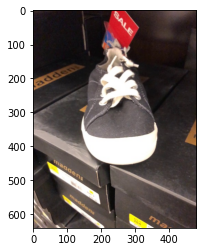

In [19]:
from cv2_plt_imshow import cv2_plt_imshow
cv2_plt_imshow(img)

In [20]:
import re
uid = "hdf5_bike/00007_20"
m = re.match("hdf5_(\w+)/(\d+)_(\d+)", uid)
category, sequence, frame = m[1],m[2],m[3]

In [21]:
def filepath_from_uid(uid, subset="valid"):
    return save_jpg(uid)

def image_tag(file_path, title=None, caption="n/a"):
    if title is None:
        title=file_path
    return f"<div style='height:240px;width:160px;float:left;'><div>{caption}</div><img src='{file_path}' title={title}></img></div>"

In [22]:
info_df["x"]=embeddings_tsne[:,0]
info_df["y"]=embeddings_tsne[:,1]

In [23]:
import plotly.express as px
fig = px.scatter(info_df, x="x", y="y", color="category", hover_name="uid", color_discrete_sequence=px.colors.qualitative.Vivid, )
fig.update_traces(marker=dict(
        size=5,
        #color=info[0].astype(int),                # set color to an array/list of desired values
        #colorscale='Viridis',   # choose a colorscale
        opacity=0.6
    ))

fig.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))
fig.update_layout({"height": 600, "width": 600})
fig.update_layout(showlegend=False)
fig.show()


In [24]:
seq_id = list(info_df["sequence_id"].astype(int))

In [25]:
info[0]

array(['6', '3', '1', ..., '3', '6', '0'], dtype='<U25')

In [26]:
seq_id

[1578,
 87,
 976,
 1379,
 279,
 115,
 1078,
 244,
 531,
 471,
 1002,
 839,
 845,
 55,
 839,
 856,
 469,
 1105,
 310,
 245,
 955,
 460,
 1554,
 740,
 145,
 1172,
 401,
 341,
 993,
 782,
 582,
 1253,
 84,
 45,
 1373,
 77,
 1278,
 1462,
 165,
 1368,
 200,
 763,
 1489,
 978,
 519,
 1323,
 400,
 1117,
 563,
 145,
 279,
 844,
 743,
 84,
 341,
 1095,
 861,
 1168,
 155,
 575,
 1410,
 1096,
 1222,
 978,
 318,
 1578,
 1490,
 1217,
 1362,
 76,
 322,
 1129,
 1244,
 958,
 935,
 28,
 1321,
 1097,
 1020,
 196,
 118,
 1186,
 1107,
 398,
 26,
 1624,
 706,
 1129,
 1125,
 1245,
 733,
 22,
 488,
 1501,
 315,
 1027,
 411,
 101,
 522,
 1053,
 1435,
 778,
 1018,
 1410,
 318,
 1236,
 114,
 124,
 1368,
 1168,
 1375,
 861,
 851,
 1527,
 1278,
 1408,
 1283,
 367,
 692,
 939,
 354,
 766,
 560,
 1543,
 492,
 1109,
 251,
 302,
 682,
 409,
 1244,
 291,
 1006,
 139,
 754,
 322,
 130,
 965,
 887,
 1051,
 856,
 113,
 763,
 1379,
 450,
 186,
 973,
 1371,
 1420,
 1373,
 422,
 145,
 1091,
 261,
 310,
 1402,
 499,
 165,
 1

In [27]:
out2d = widgets.HTML()

fig2d = go.FigureWidget(data=[go.Scatter(
    #height=600,
    x=embeddings_tsne[:,0],
    y=embeddings_tsne[:,1],
    text=info[1],
    #labels=info_df["category"],
    mode='markers',
    marker=dict(
        size=4,
        #color=seq_id,                # set color to an array/list of desired values
        color=info[0].astype(int),
        colorscale='Viridis',   # choose a colorscale
        opacity=0.6
    )
)])
def update_point(trace, points, selector):
    global out
    global info
    global scatter
    point_id = points.point_inds[0]
    uid=scatter.text[point_id]
    file_path = filepath_from_uid(uid)
    out2d.value=image_tag(file_path, caption="")

scatter = fig2d.data[0]
fig2d.update_layout({"height": 800})
fig2d.update_layout(legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
))

scatter.on_hover(update_point)
display(out2d)
display(fig2d)


HTML(value='')

FigureWidget({
    'data': [{'marker': {'color': array([6, 3, 1, ..., 3, 6, 0]),
                         'col…

In [28]:

projected_embeddings=embeddings_pca
#projected_embeddings=embeddings_tsne

df = pd.DataFrame(projected_embeddings)
fig = go.FigureWidget(data=[go.Scatter3d(
    x=projected_embeddings[:,0],
    y=projected_embeddings[:,1],
    z=projected_embeddings[:,2],
    text=info[1],
    mode='markers',
    marker=dict(
        size=1,
        color=info[0].astype(int),                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.6
    )
)])
scatter = fig.data[0]
fig.layout.hovermode = 'closest'

out = widgets.HTML()
display(out)
out.value="<p>Hi there!</p>"

# create our callback function
def update_point(trace, points, selector):
    global out
    global info
    global scatter
    point_id = points.point_inds[0]
    uid=scatter.text[point_id]
    file_path = save_jpg(uid)
    out.value=image_tag(file_path, caption="")

def change_category(x):
    global scatter
    global projected_embeddings
    global info_df
    
    if x=="all":
        scatter.x = projected_embeddings[:,0]
        scatter.y = projected_embeddings[:,1]
        scatter.z = projected_embeddings[:,2]
        scatter.text = info_df["uid"]
    else:
        indices = info_df["uid"].str.contains(x)
        scatter.x = projected_embeddings[indices,0]
        scatter.y = projected_embeddings[indices,1]
        scatter.z = projected_embeddings[indices,2]  
        scatter.text = info_df[info_df["uid"].str.contains(x)]["uid"]

    return 
scatter.on_hover(update_point)
interact(change_category, x=widget_categories)
display(fig)


HTML(value='')

interactive(children=(Combobox(value='', description='Categories:', ensure_option=True, options=('all', 'bike'…

FigureWidget({
    'data': [{'marker': {'color': array([6, 3, 1, ..., 3, 6, 0]),
                         'col…

In [29]:
import cupy as cp

In [30]:
cuda_embeddings = cp.array(embeddings)

In [31]:
slices = []
slice_size=10000
from tqdm import tqdm

In [32]:
for i in tqdm(range(0,int(len(embeddings)/slice_size)+1)):
    start = i*slice_size
    end = i*slice_size + slice_size
    if end > len(embeddings):
        end = len(embeddings)
    slice = cp.dot(cuda_embeddings[start:end],cuda_embeddings.T).get()
    slices.append(slice)
    #print(i*slice_size, end)

100%|██████████| 7/7 [00:08<00:00,  1.15s/it]


In [33]:
similarity_matrix = np.vstack(slices)

In [34]:
similarity_matrix

array([[1.    , 0.5835, 0.6113, ..., 0.6035, 0.8716, 0.528 ],
       [0.5835, 1.    , 0.5283, ..., 0.759 , 0.5854, 0.53  ],
       [0.6113, 0.5283, 1.    , ..., 0.4802, 0.595 , 0.451 ],
       ...,
       [0.6035, 0.759 , 0.4802, ..., 1.    , 0.5864, 0.5522],
       [0.8716, 0.5854, 0.595 , ..., 0.5864, 1.    , 0.4688],
       [0.528 , 0.53  , 0.451 , ..., 0.5522, 0.4688, 1.    ]],
      dtype=float16)

In [35]:
import pandas as pd
np.fill_diagonal(similarity_matrix,0)

In [36]:
#train_info_df["category"]=train_info_df["uid"].str.extract("(.*?)-")
#train_info_df["sequence_id"]=train_info_df["uid"].str.extract("(batch-\d+_\d+_\d+)")
#train_info_df["frame_id"]=train_info_df["uid"].str.extract("(\d+)$")
#train_info_df["sequence_uid"] = train_info_df["category"] + "_" + train_info_df["sequence_id"]

In [37]:
categories = info_df["category"].unique()


In [38]:
visited = [0]

def visit(node, similarity_matrix, k=1, threshold=0.95):
    i=node
    nn = (-similarity_matrix[i]).argsort()[0:k]
    valid_nn = []
    for j in nn:
        if similarity_matrix[i,j] > threshold:
            valid_nn.append(j)
    return valid_nn
visit(0, similarity_matrix)

[43005]

In [39]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import gc
gc.collect()

0

In [40]:
sequences_combo = widgets.Combobox(
    placeholder='Choose Sequence',
    options=list(info_df["uid"].unique()),
    description='Combobox:',
    ensure_option=True,
    disabled=False
)
which_radio = widgets.RadioButtons(
    options=['all', 'others', 'exclusive'],
    description='Show neighbors from sequences:',
    disabled=False
)

In [41]:
similarity_matrix

array([[0.    , 0.5835, 0.6113, ..., 0.6035, 0.8716, 0.528 ],
       [0.5835, 0.    , 0.5283, ..., 0.759 , 0.5854, 0.53  ],
       [0.6113, 0.5283, 0.    , ..., 0.4802, 0.595 , 0.451 ],
       ...,
       [0.6035, 0.759 , 0.4802, ..., 0.    , 0.5864, 0.5522],
       [0.8716, 0.5854, 0.595 , ..., 0.5864, 0.    , 0.4688],
       [0.528 , 0.53  , 0.451 , ..., 0.5522, 0.4688, 0.    ]],
      dtype=float16)

In [42]:
out_similar = widgets.HTML()
which = "all"

def f(x, which):
    global out_similar
    max_thumb = 6
    idx =info_df[info_df["uid"]==x].index[0]
    sequence_uid = info_df.iloc[idx]["sequence_uid"]
    neighbors = visit(idx, similarity_matrix, k=1000, threshold=0)
    valid_neighbbors = neighbors
    sequence_uids = [sequence_uid]
    if which=="others" or which=="exclusive":
        valid_neighbbors=[]
        for n in neighbors:
            sequence_uid = str(info_df.iloc[n]["sequence_uid"])
            if not sequence_uid in sequence_uids:
                valid_neighbbors.append(n)
            if which=='exclusive':
                sequence_uids.append(sequence_uid)

    html="<div>"
    file_path = save_jpg(x)
    print(file_path)
    html+=image_tag(file_path,x, caption="similarity:")
    for i, n in enumerate(valid_neighbbors):
        uid = info_df.iloc[n]["uid"]
        file_path = filepath_from_uid(uid)
        html+=image_tag(file_path, uid, caption=f"{similarity_matrix[idx, n]:.2f}")
        if i > max_thumb:
            break
    html+="</div>"
    out_similar.value = html
    return 


def g(x):
    global which
    which = x
    
print(categories)
display(out_similar)
interact(f, x=sequences_combo, which=which_radio)
#interact(g, o)

['cup' 'camera' 'book' 'laptop' 'shoe' 'bottle' 'chair' 'bike'
 'cereal_box']


HTML(value='')

interactive(children=(Combobox(value='', description='Combobox:', ensure_option=True, options=('hdf5_cup/01578…

<function __main__.f(x, which)>

In [43]:
def visit_train(embedding, train_embeddings, k=1000, threshold=0.5):
    #i=node
    similarity_vector = np.dot(embedding, train_embeddings)
    nn = (-similarity_vector).argsort()[0:k]
    valid_nn = []
    for j in nn:
        if similarity_vector[j] > threshold:
            valid_nn.append(j)
    return valid_nn, similarity_vector

In [44]:
sequences_combo_train = widgets.Combobox(
    placeholder='Choose Sequence',
    options=list(info_df["uid"].unique()),
    description='Combobox:',
    ensure_option=True,
    disabled=False
)
which_radio_train = widgets.RadioButtons(
    options=['others', 'exclusive'],
    description='Show neighbors from sequences:',
    disabled=False
)

In [45]:
out_similar = widgets.HTML()
which = "others"

def f_train(x, which):
    global out_similar
    
    max_thumb = 6
    idx =info_df[info_df["uid"]==x].index[0]
    sequence_uid = info_df.iloc[idx]["sequence_uid"]
    
    neighbors, similarity_vector = visit_train(embeddings[idx], train_embeddings, k=1000, threshold=0)
    print(idx)
    valid_neighbbors = neighbors
    sequence_uids = {sequence_uid: True}
    valid_neighbbors_idx = []
    if which=="others" or which=="exclusive":
        valid_neighbbors=[]
        for i, n in enumerate(neighbors):
            sequence_uid = str(train_info_df.iloc[n]["sequence_uid"])
            if not sequence_uid in sequence_uids:
                valid_neighbbors.append(n)
                valid_neighbbors_idx.append(i)
                if which=='exclusive':
                    sequence_uids[sequence_uid] = True

    html="<div>"
    file_path = filepath_from_uid(x)
    html+=image_tag(file_path,x, caption="similarity:")
    for i, n in enumerate(valid_neighbbors):
        uid = train_info_df.iloc[n]["uid"]
        k = valid_neighbbors_idx[i]
        file_path = filepath_from_uid(uid, subset="train")
        html+=image_tag(file_path, uid, caption=f"{similarity_vector[n]:.2f}, k={k}")
        if i > max_thumb:
            break
        #print(file_path)
    html+="</div>"
    out_similar.value = html
    return 


def g(x):
    global which
    which = x
    
print(categories)
interact(f_train, x=sequences_combo_train, which=which_radio_train)
display(out_similar)



['cup' 'camera' 'book' 'laptop' 'shoe' 'bottle' 'chair' 'bike'
 'cereal_box']


interactive(children=(Combobox(value='', description='Combobox:', ensure_option=True, options=('hdf5_cup/01578…

HTML(value='')

In [46]:
info_df["sequence_uid"]

0           cup_01578
1        camera_00087
2          book_00976
3          book_01379
4        laptop_00279
             ...     
61398    camera_00538
61399       cup_01087
61400    camera_00013
61401       cup_00429
61402      bike_00310
Name: sequence_uid, Length: 61403, dtype: object

In [47]:
neighbors, similarity_vector = visit_train(embeddings[10], train_embeddings, k=1000, threshold=0)

In [48]:
sequence_uid = str(train_info_df.iloc[243397]["sequence_uid"])
sequence_uid

'chair_01146'

In [49]:
#neighbors

In [50]:
sequence_embeddings_info = info_df[info_df["sequence_uid"]=="bike_00007"]
sequence_embeddings = embeddings[sequence_embeddings_info.index]
sequence_pca = PCA(n_components=10)
sequence_embeddings_pca = sequence_pca.fit_transform(sequence_embeddings)
sequence_embeddings_info = sequence_embeddings_info.reset_index()

In [51]:
sequence_embeddings_info

,index,class_id,uid,category,sequence_id,frame_id,sequence_uid,x,y
0,253,0,hdf5_bike/00007_0,bike,00007,0,bike_00007,-19.321491,-39.017986
1,290,0,hdf5_bike/00007_130,bike,00007,130,bike_00007,-19.343376,-39.029335
2,3251,0,hdf5_bike/00007_175,bike,00007,175,bike_00007,-19.337936,-39.027073
3,7940,0,hdf5_bike/00007_115,bike,00007,115,bike_00007,-19.334555,-39.024323
4,8077,0,hdf5_bike/00007_80,bike,00007,80,bike_00007,-19.321392,-39.015739
5,8448,0,hdf5_bike/00007_60,bike,00007,60,bike_00007,-19.324301,-39.017807
6,8742,0,hdf5_bike/00007_110,bike,00007,110,bike_00007,-19.329708,-39.020378
7,8952,0,hdf5_bike/00007_35,bike,00007,35,bike_00007,-19.321869,-39.017708
8,10274,0,hdf5_bike/00007_30,bike,00007,30,bike_00007,-19.320141,-39.015862
9,11877,0,hdf5_bike/00007_145,bike,00007,145,bike_00007,-19.348518,-39.031788


In [56]:


widget_sequence_uid = widgets.Combobox(
    # value='John',
    placeholder='shoe_batch-35_37',
    options=list(info_df["sequence_uid"].unique()),
    description='Categories:',
    ensure_option=True,
    disabled=False
)


df = pd.DataFrame(projected_embeddings)
fig = go.FigureWidget(data=[go.Scatter3d(
    x=sequence_embeddings_pca[:,0],
    y=sequence_embeddings_pca[:,1],
    z=sequence_embeddings_pca[:,2],
    text=sequence_embeddings_info["uid"],
    #color = sequence_embeddings_info["frame_id"],
    mode='markers',
    marker=dict(
        size=3,
        color=sequence_embeddings_info["frame_id"].astype(int),                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.6
    )
)])
scatter2 = fig.data[0]
fig.layout.hovermode = 'closest'

out2 = widgets.HTML()
display(out2)
out.value="<p>Hi there!</p>"

# create our callback function
def update_point2(trace, points, selector):
    global out2
    global info
    global scatter2
    point_id = points.point_inds[0]
    #dataset_dir="../datasets/objectron_96x96/valid"
    uid=scatter2.text[point_id].split(",")[0]
    file_path = filepath_from_uid(uid)
    out2.value=image_tag(file_path, caption="")

def change_sequence_uid(sequence_uid):
    global scatter2
    global embeddings
    global info_df
    global sequence_embeddings_pca, sequence_embeddings_info, sequence_embeddings
    if len(sequence_uid)==0:
        sequence_uid="bike_batch-3_10"
    sequence_embeddings_info = info_df[info_df["sequence_uid"]==sequence_uid]
    sequence_embeddings = embeddings[sequence_embeddings_info.index]
    sequence_pca = PCA(n_components=10)
    sequence_embeddings_pca = sequence_pca.fit_transform(sequence_embeddings)
    
    sequence_embeddings_info = sequence_embeddings_info.reset_index()

    scatter2.x = list(sequence_embeddings_pca[:,0])
    scatter2.y = list(sequence_embeddings_pca[:,1])
    scatter2.z = list(sequence_embeddings_pca[:,2])
    scatter2.marker.color = sequence_embeddings_info["frame_id"].astype(int)

    scatter2.text = sequence_embeddings_info["uid"] + ","+ sequence_embeddings_info["index"].astype(str)
    return 

display(fig)
scatter2.on_hover(update_point2)
interact(change_sequence_uid, sequence_uid=widget_sequence_uid)

#scatter2.marker.color=

HTML(value='')

FigureWidget({
    'data': [{'marker': {'color': array([ 80,  50, 175, 130, 295,  15,  75, 185, 300, 275,  55,…

interactive(children=(Combobox(value='', description='Categories:', ensure_option=True, options=('cup_01578', …

<function __main__.change_sequence_uid(sequence_uid)>

In [53]:


widget_sequence_uid = widgets.Combobox(
    # value='John',
    placeholder='shoe_batch-35_37',
    options=list(info_df["sequence_uid"].unique()),
    description='Categories:',
    ensure_option=True,
    disabled=False
)


df = pd.DataFrame(projected_embeddings)
fig = go.FigureWidget(data=[go.Scatter(
    x=sequence_embeddings_pca[:,0],
    y=sequence_embeddings_pca[:,1],
    #z=sequence_embeddings_pca[:,2],
    text=sequence_embeddings_info["uid"],
    #color = sequence_embeddings_info["frame_id"],
    mode='markers',
    marker=dict(
        size=10,
        color=sequence_embeddings_info["frame_id"].astype(int),                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.6
    )
)])
scatter2 = fig.data[0]
fig.layout.hovermode = 'closest'

out2 = widgets.HTML()
display(out2)
out.value="<p>Hi there!</p>"

# create our callback function
def update_point2(trace, points, selector):
    global out2
    global info
    global scatter2
    point_id = points.point_inds[0]
    #dataset_dir="../datasets/objectron_96x96/valid"
    uid=scatter2.text[point_id].split(",")[0]
    file_path = filepath_from_uid(uid)
    out2.value=image_tag(file_path, caption="")

def change_sequence_uid(sequence_uid):
    global scatter2
    global embeddings
    global info_df
    global sequence_embeddings_pca, sequence_embeddings_info, sequence_embeddings
    if len(sequence_uid)==0:
        sequence_uid="bike_batch-3_10"
    sequence_embeddings_info = info_df[info_df["sequence_uid"]==sequence_uid]
    sequence_embeddings = embeddings[sequence_embeddings_info.index]
    sequence_pca = PCA(n_components=10)
    sequence_embeddings_pca = sequence_pca.fit_transform(sequence_embeddings)
    
    sequence_embeddings_info = sequence_embeddings_info.reset_index()

    scatter2.x = list(sequence_embeddings_pca[:,0])
    scatter2.y = list(sequence_embeddings_pca[:,1])
    
    #scatter2.z = list(sequence_embeddings_pca[:,2])
    scatter2.marker.color = sequence_embeddings_info["frame_id"].astype(int)
    print(sequence_pca.explained_variance_ratio_)
    scatter2.text = sequence_embeddings_info["uid"] + ","+ sequence_embeddings_info["index"].astype(str)
    
    return 

display(fig)
scatter2.on_hover(update_point2)
interact(change_sequence_uid, sequence_uid=widget_sequence_uid)

#scatter2.marker.color=

HTML(value='')

FigureWidget({
    'data': [{'marker': {'color': array([], dtype=int64),
                         'colorscale'…

interactive(children=(Combobox(value='', description='Categories:', ensure_option=True, options=('cup_01578', …

<function __main__.change_sequence_uid(sequence_uid)>

In [81]:
variance_ratios=[]
for sequence_uid in tqdm(list(info_df["sequence_uid"].unique())):
    sequence_embeddings_info = info_df[info_df["sequence_uid"]==sequence_uid]
    sequence_embeddings = embeddings[sequence_embeddings_info.index]
    sequence_pca = PCA(n_components=10)
    sequence_embeddings_pca = sequence_pca.fit_transform(sequence_embeddings)
    variance_ratios.append(sequence_pca.explained_variance_ratio_)

100%|█████████▉| 1155/1156 [00:21<00:00, 53.04it/s]


ValueError: n_components=10 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'

In [82]:
np.array(variance_ratios)[:,0:3].mean(axis=0)

array([0.55531367, 0.19788049, 0.07566665])

In [83]:
np.array(variance_ratios)[:,0:3].mean(axis=0)[0:2].sum()

0.7531941579948691

In [84]:
np.array(variance_ratios)[:,0:3].mean(axis=0)[0:3].sum()

0.8288608095757805

In [58]:
df = pd.DataFrame(projected_embeddings)
fig = go.FigureWidget(data=[go.Scatter(
    x=sequence_embeddings_pca[:,0],
    y=sequence_embeddings_pca[:,1],
    #z=sequence_embeddings_pca[:,2],
    text=sequence_embeddings_info["uid"],
    mode='markers',
    marker=dict(
        size=3,
        color=info[0].astype(int),                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.6
    )
)])
scatter2 = fig.data[0]
fig.layout.hovermode = 'closest'


In [59]:
fig

FigureWidget({
    'data': [{'marker': {'color': array([6, 3, 1, ..., 3, 6, 0]),
                         'col…

In [55]:
sequence_embeddings_info["uid"]

Series([], Name: uid, dtype: object)

In [60]:
info[0]

array(['6', '3', '1', ..., '3', '6', '0'], dtype='<U25')

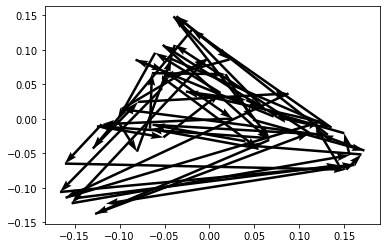

In [56]:
import numpy as np
import matplotlib.pyplot as plt

#x = np.linspace(0, 2*np.pi, 10)
#y = np.sin(x)
x=sequence_embeddings_pca[:,0]
y=sequence_embeddings_pca[:,1]


plt.figure()
plt.quiver(x[:-1], y[:-1], x[1:]-x[:-1], y[1:]-y[:-1], scale_units='xy', angles='xy', scale=1)

plt.show()

In [57]:
sequence_embeddings_pca[:,0]

array([-0.14790243,  0.14414758,  0.11764577,  0.07155909, -0.08223784,
       -0.05047095,  0.0255762 , -0.11986345, -0.16088375,  0.15226713,
        0.16923322,  0.04139222,  0.03976884, -0.06331966,  0.13181428,
       -0.03679789,  0.02248862, -0.05253774,  0.05438131, -0.06621176,
       -0.06403668,  0.01793074,  0.04849414,  0.17247993,  0.1241839 ,
       -0.09786165, -0.00269669, -0.15340496,  0.15602596,  0.15002691,
        0.06333591, -0.03995522,  0.06706775, -0.12522389, -0.05128586,
        0.01232127, -0.06040549, -0.10238373, -0.08067908, -0.04246376,
        0.1358134 , -0.0195854 , -0.12983466, -0.07944802,  0.08805158,
       -0.1601752 ,  0.12360994, -0.02627284,  0.04104772,  0.05803326,
       -0.05197049,  0.06644199, -0.12729164,  0.11153077, -0.03861621,
       -0.05272864, -0.1662987 ,  0.16156589, -0.11539102])

In [104]:
sorted_y = [y for _, y in sorted(zip(x,y), key=lambda pair: pair[0])]
sorted_x = [x for x, _ in sorted(zip(x,y), key=lambda pair: pair[0])]

In [105]:
sorted_x,sorted_y = np.array(sorted_x), np.array(sorted_y)

In [106]:
sorted_x.shape, sorted_y.shape

((27,), (27,))

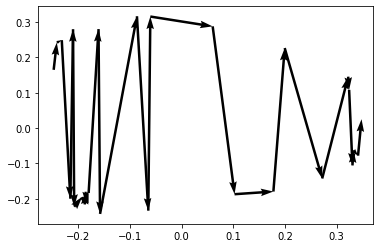

In [107]:

plt.figure()
plt.quiver(sorted_x[:-1], sorted_y[:-1], sorted_x[1:]-sorted_x[:-1], sorted_y[1:]-sorted_y[:-1], scale_units='xy', angles='xy', scale=1)

plt.show()